###

#### Load the car insurance claim dataset

In [92]:
import pandas as pd
import numpy as np
import random

# Load the car insurance claim dataset
df_insurance = pd.read_csv(r'D:\USA\Semester 1 MSU\CMSE 830\car_insurance_claim.csv')

print("Original Insurance Dataset:")
print(df_insurance.shape)
print(df_insurance.columns)
print(df_insurance.head())

# Function to generate a random zip code
def generate_zip_code():
    return f"{random.randint(10000, 18000):05d}"

# List of US states
states = ['AL', 'AK', 'AZ', 'AR', 'CA', 'CO', 'CT', 'DE', 'FL', 'GA', 'HI', 'ID', 'IL', 'IN', 'IA', 'KS', 'KY', 'LA', 'ME', 'MD', 'MA', 'MI', 'MN', 'MS', 'MO', 'MT', 'NE', 'NV', 'NH', 'NJ', 'NM', 'NY', 'NC', 'ND', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'VT', 'VA', 'WA', 'WV', 'WI', 'WY']

# Add ZIP_CODE and STATE columns
df_insurance['ZIP_CODE'] = [generate_zip_code() for _ in range(len(df_insurance))]
df_insurance['STATE'] = np.random.choice(states, size=len(df_insurance))

print("\nInsurance Dataset after adding ZIP_CODE and STATE:")
print(df_insurance.shape)
print(df_insurance[['ZIP_CODE', 'STATE']].head())

Original Insurance Dataset:
(10302, 27)
Index(['ID', 'KIDSDRIV', 'BIRTH', 'AGE', 'HOMEKIDS', 'YOJ', 'INCOME',
       'PARENT1', 'HOME_VAL', 'MSTATUS', 'GENDER', 'EDUCATION', 'OCCUPATION',
       'TRAVTIME', 'CAR_USE', 'BLUEBOOK', 'TIF', 'CAR_TYPE', 'RED_CAR',
       'OLDCLAIM', 'CLM_FREQ', 'REVOKED', 'MVR_PTS', 'CLM_AMT', 'CAR_AGE',
       'CLAIM_FLAG', 'URBANICITY'],
      dtype='object')
          ID  KIDSDRIV    BIRTH   AGE  HOMEKIDS   YOJ   INCOME PARENT1  \
0   63581743         0  16MAR39  60.0         0  11.0  $67,349      No   
1  132761049         0  21JAN56  43.0         0  11.0  $91,449      No   
2  921317019         0  18NOV51  48.0         0  11.0  $52,881      No   
3  727598473         0  05MAR64  35.0         1  10.0  $16,039      No   
4  450221861         0  05JUN48  51.0         0  14.0      NaN      No   

   HOME_VAL MSTATUS  ... CAR_TYPE RED_CAR OLDCLAIM  CLM_FREQ REVOKED MVR_PTS  \
0        $0    z_No  ...  Minivan     yes   $4,461         2      No       3   
1 

#### Loading the reduced real estate dataset

In [93]:
# Function to generate a random zip code
def generate_zip_code():
    return f"{random.randint(10000, 18000):05d}"

# List of US states
states = ['AL', 'AK', 'AZ', 'AR', 'CA', 'CO', 'CT', 'DE', 'FL', 'GA', 'HI', 'ID', 'IL', 'IN', 'IA', 'KS', 'KY', 'LA', 'ME', 'MD', 'MA', 'MI', 'MN', 'MS', 'MO', 'MT', 'NE', 'NV', 'NH', 'NJ', 'NM', 'NY', 'NC', 'ND', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'VT', 'VA', 'WA', 'WV', 'WI', 'WY']

# List of sample cities (add more as needed)
cities = ['New York', 'Los Angeles', 'Chicago', 'Houston', 'Phoenix', 'Philadelphia', 'San Antonio', 'San Diego', 'Dallas', 'San Jose']

# Load the real estate data
df_real_estate = pd.read_csv(r'D:\USA\Semester 1 MSU\CMSE 830\reduced_real_estate_data.csv')

# Select only the columns we want to keep
columns_to_keep = ['price', 'house_size', 'acre_lot']
df_real_estate = df_real_estate[columns_to_keep]

# Add ZIP_CODE, CITY, and STATE columns
df_real_estate['ZIP_CODE'] = [generate_zip_code() for _ in range(len(df_real_estate))]
df_real_estate['CITY'] = np.random.choice(cities, size=len(df_real_estate))
df_real_estate['STATE'] = np.random.choice(states, size=len(df_real_estate))

print("\nReal Estate Dataset after adding ZIP_CODE, CITY, and STATE:")
print(df_real_estate.shape)
print(df_real_estate[['ZIP_CODE', 'CITY', 'STATE']].head())


Real Estate Dataset after adding ZIP_CODE, CITY, and STATE:
(23723, 6)
  ZIP_CODE          CITY STATE
0    11826       Houston    AZ
1    17405       Chicago    IN
2    14676   Los Angeles    DE
3    15596  Philadelphia    PA
4    16377       Chicago    MA


In [94]:
# Ensure ZIP_CODE/zip_code are in the same format in both datasets
df_insurance['ZIP_CODE'] = df_insurance['ZIP_CODE'].astype(str).str.zfill(5)
df_real_estate['ZIP_CODE'] = df_real_estate['ZIP_CODE'].astype(str).str.zfill(5)

#### Merging Car insurance data with real estate data

In [95]:
# Merge datasets based on ZIP_CODE
df_merged = pd.merge(df_insurance, df_real_estate, on='ZIP_CODE', how='left')

# Check the columns after merging
print("\nMerged dataset columns:")
print(df_merged.columns)

# Drop the unnecessary STATE column (if present) and rename
if 'STATE_y' in df_merged.columns:
    df_merged = df_merged.drop(columns=['STATE_y'])
if 'STATE_x' in df_merged.columns:
    df_merged.rename(columns={'STATE_x': 'STATE'}, inplace=True)

# Ensure the remaining STATE column is indeed named 'STATE'
print("\nUpdated dataset columns after renaming STATE column:")
print(df_merged.columns)

# 1. Check the shape of the merged dataset
print(f"Merged dataset shape: {df_merged.shape}")

# 2. Check for missing values
missing_values = df_merged.isnull().sum()
print("\nMissing values in each column:")
print(missing_values)

# 3. Check for duplicates based on ZIP_CODE
duplicates = df_merged.duplicated(subset='ZIP_CODE').sum()
print(f"\nNumber of duplicate rows based on ZIP_CODE: {duplicates}")

# 4. Check the data types of the columns
print("\nData types of each column:")
print(df_merged.dtypes)
print(df_merged.head)


# 5. Validate ZIP_CODE and STATE columns
# Ensure ZIP_CODE contains only 5-digit strings
invalid_zip_codes = df_merged[~df_merged['ZIP_CODE'].str.match(r'^\d{5}$')]
print(f"\nNumber of invalid ZIP_CODE entries: {len(invalid_zip_codes)}")

# Ensure STATE contains only valid 2-letter US state codes
if 'STATE' in df_merged.columns:
    valid_states = set(states)  # Assuming 'states' list from earlier
    invalid_states = df_merged[~df_merged['STATE'].isin(valid_states)]
    print(f"\nNumber of invalid STATE entries: {len(invalid_states)}")

    # (Optional) Visual check for invalid entries
    print("\nInvalid STATE entries (if any):")
    print(invalid_states.head())
else:
    print("\nNo STATE column found in the merged dataset.")



Merged dataset columns:
Index(['ID', 'KIDSDRIV', 'BIRTH', 'AGE', 'HOMEKIDS', 'YOJ', 'INCOME',
       'PARENT1', 'HOME_VAL', 'MSTATUS', 'GENDER', 'EDUCATION', 'OCCUPATION',
       'TRAVTIME', 'CAR_USE', 'BLUEBOOK', 'TIF', 'CAR_TYPE', 'RED_CAR',
       'OLDCLAIM', 'CLM_FREQ', 'REVOKED', 'MVR_PTS', 'CLM_AMT', 'CAR_AGE',
       'CLAIM_FLAG', 'URBANICITY', 'ZIP_CODE', 'STATE_x', 'price',
       'house_size', 'acre_lot', 'CITY', 'STATE_y'],
      dtype='object')

Updated dataset columns after renaming STATE column:
Index(['ID', 'KIDSDRIV', 'BIRTH', 'AGE', 'HOMEKIDS', 'YOJ', 'INCOME',
       'PARENT1', 'HOME_VAL', 'MSTATUS', 'GENDER', 'EDUCATION', 'OCCUPATION',
       'TRAVTIME', 'CAR_USE', 'BLUEBOOK', 'TIF', 'CAR_TYPE', 'RED_CAR',
       'OLDCLAIM', 'CLM_FREQ', 'REVOKED', 'MVR_PTS', 'CLM_AMT', 'CAR_AGE',
       'CLAIM_FLAG', 'URBANICITY', 'ZIP_CODE', 'STATE', 'price', 'house_size',
       'acre_lot', 'CITY'],
      dtype='object')
Merged dataset shape: (31035, 33)

Missing values in each co

### Handle Missing Values for Insurance Columns

<>:16: SyntaxWarning:

invalid escape sequence '\$'

<>:22: SyntaxWarning:

invalid escape sequence '\$'

<>:16: SyntaxWarning:

invalid escape sequence '\$'

<>:22: SyntaxWarning:

invalid escape sequence '\$'

C:\Users\siddh\AppData\Local\Temp\ipykernel_25284\2381104230.py:16: SyntaxWarning:

invalid escape sequence '\$'

C:\Users\siddh\AppData\Local\Temp\ipykernel_25284\2381104230.py:22: SyntaxWarning:

invalid escape sequence '\$'



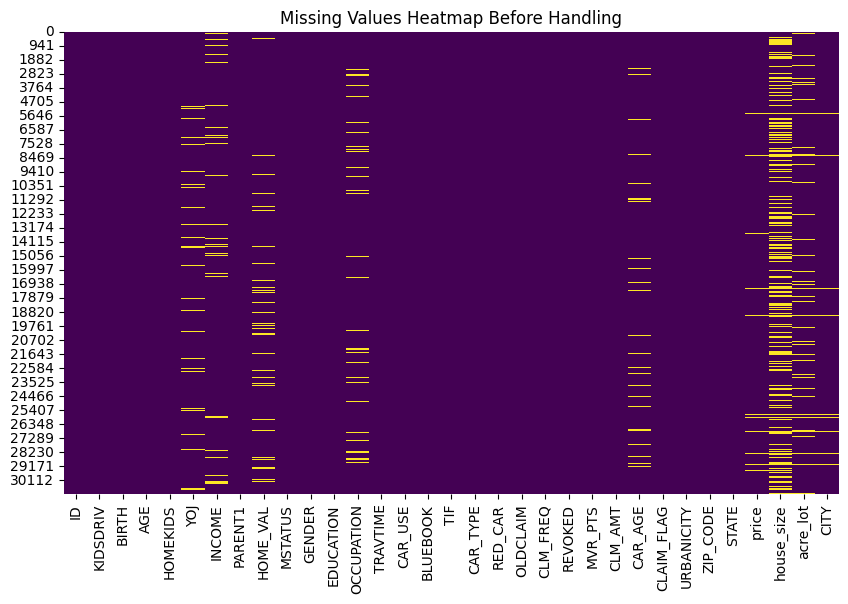

C:\Users\siddh\AppData\Local\Temp\ipykernel_25284\2381104230.py:12: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



C:\Users\siddh\AppData\Local\Temp\ipykernel_25284\2381104230.py:13: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplac

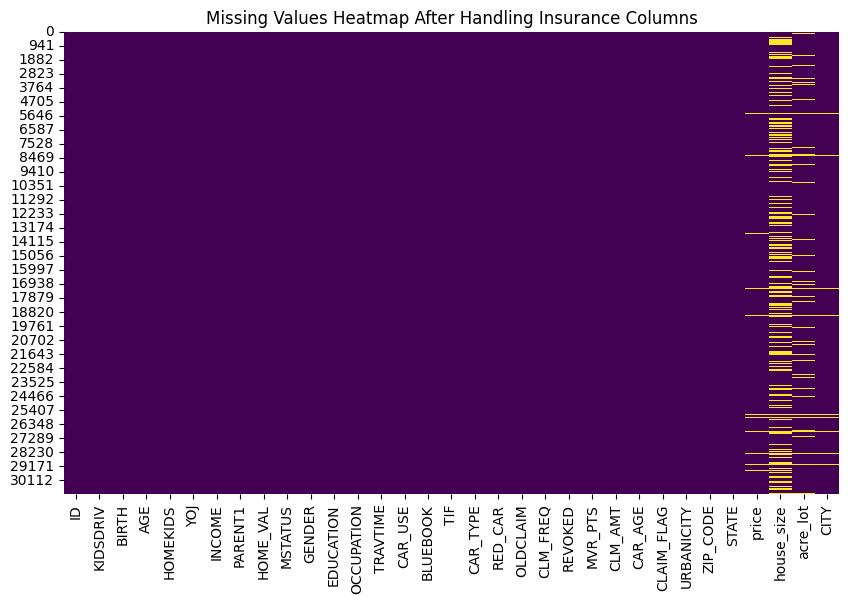

In [96]:
import seaborn as sns
import matplotlib.pyplot as plt


# Initial missing value visualization
plt.figure(figsize=(10, 6))
sns.heatmap(df_merged.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Values Heatmap Before Handling')
plt.show()

# Handle missing values in car insurance data
df_merged['AGE'].fillna(df_merged['AGE'].median(), inplace=True)
df_merged['YOJ'].fillna(df_merged['YOJ'].median(), inplace=True)

# Clean the INCOME column
df_merged['INCOME'] = df_merged['INCOME'].replace({'\$': '', ',': ''}, regex=True).astype(float)


df_merged['INCOME'].fillna(df_merged['INCOME'].median(), inplace=True)

# Clean the HOME_VAL column
df_merged['HOME_VAL'] = df_merged['HOME_VAL'].replace({'\$': '', ',': ''}, regex=True).astype(float)

df_merged['HOME_VAL'].fillna(df_merged['HOME_VAL'].median(), inplace=True)

df_merged['OCCUPATION'].fillna(df_merged['OCCUPATION'].mode()[0], inplace=True)

df_merged['CAR_AGE'].fillna(df_merged['CAR_AGE'].median(), inplace=True)

# Visualization after handling missing values
plt.figure(figsize=(10, 6))
sns.heatmap(df_merged.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Values Heatmap After Handling Insurance Columns')
plt.show()


### : KNN for Real Estate Data Handling

In [1]:
pip install scikit-learn


Note: you may need to restart the kernel to use updated packages.


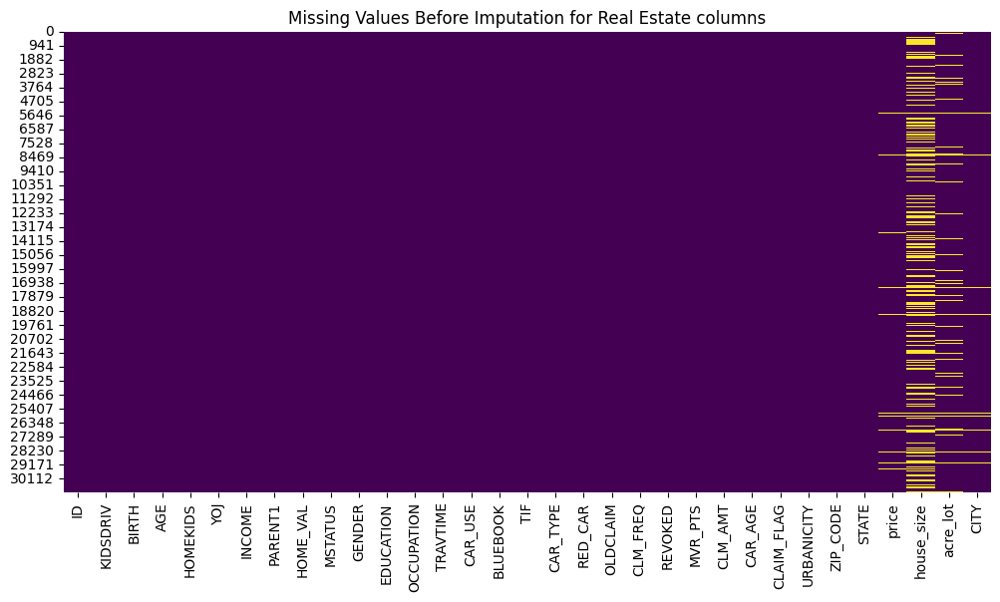

C:\Users\siddh\AppData\Local\Temp\ipykernel_25284\2907276423.py:24: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





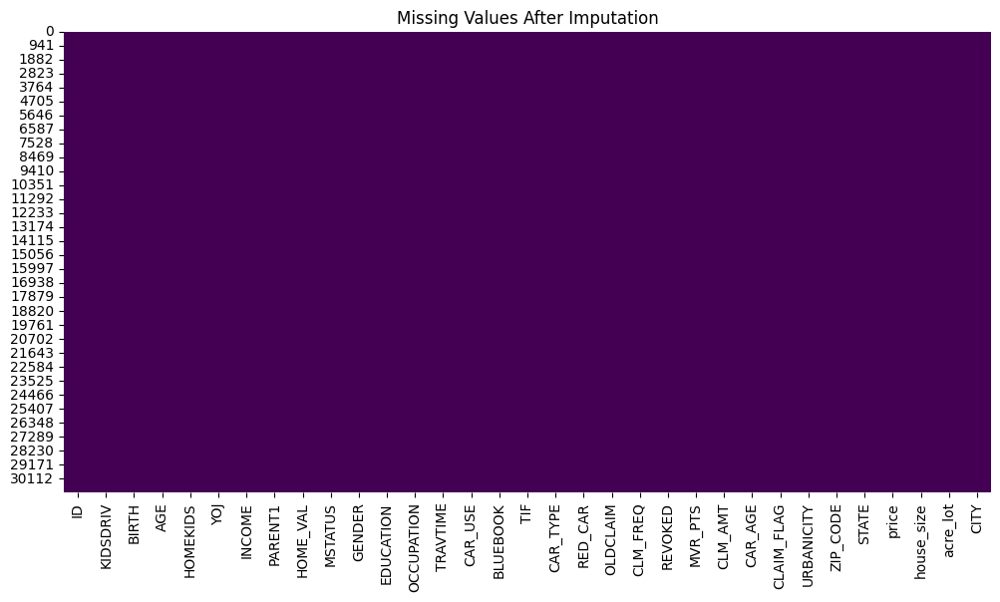

Missing values in each column after handling missing values:
ID            0
KIDSDRIV      0
BIRTH         0
AGE           0
HOMEKIDS      0
YOJ           0
INCOME        0
PARENT1       0
HOME_VAL      0
MSTATUS       0
GENDER        0
EDUCATION     0
OCCUPATION    0
TRAVTIME      0
CAR_USE       0
BLUEBOOK      0
TIF           0
CAR_TYPE      0
RED_CAR       0
OLDCLAIM      0
CLM_FREQ      0
REVOKED       0
MVR_PTS       0
CLM_AMT       0
CAR_AGE       0
CLAIM_FLAG    0
URBANICITY    0
ZIP_CODE      0
STATE         0
price         0
house_size    0
acre_lot      0
CITY          0
dtype: int64


In [97]:
from sklearn.impute import KNNImputer

# Sample DataFrame (Replace this with your actual DataFrame)
# df_merged = pd.read_csv('your_file.csv')  # Load your data

# Visualize missing values before imputation
plt.figure(figsize=(12, 6))
sns.heatmap(df_merged.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Values Before Imputation for Real Estate columns")
plt.show()

# Separate numeric columns (make sure to include your actual numeric columns)
numeric_cols = ['price', 'house_size', 'acre_lot', 'CAR_AGE']  # Add other numeric columns
categorical_cols = ['CITY']  # Add other categorical columns

# Initialize KNN Imputer
imputer = KNNImputer(n_neighbors=5)

# Perform KNN imputation on numeric columns
df_merged[numeric_cols] = imputer.fit_transform(df_merged[numeric_cols])

# Impute categorical column (using mode)
for col in categorical_cols:
    df_merged[col].fillna(df_merged[col].mode()[0], inplace=True)

# Visualize missing values after imputation
plt.figure(figsize=(12, 6))
sns.heatmap(df_merged.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Values After Imputation")
plt.show()

# Verify missing values in all columns
print("Missing values in each column after handling missing values:")
print(df_merged.isnull().sum())


#### Encoding values

In [98]:
# Check the columns in the DataFrame
print(df_merged.columns)


Index(['ID', 'KIDSDRIV', 'BIRTH', 'AGE', 'HOMEKIDS', 'YOJ', 'INCOME',
       'PARENT1', 'HOME_VAL', 'MSTATUS', 'GENDER', 'EDUCATION', 'OCCUPATION',
       'TRAVTIME', 'CAR_USE', 'BLUEBOOK', 'TIF', 'CAR_TYPE', 'RED_CAR',
       'OLDCLAIM', 'CLM_FREQ', 'REVOKED', 'MVR_PTS', 'CLM_AMT', 'CAR_AGE',
       'CLAIM_FLAG', 'URBANICITY', 'ZIP_CODE', 'STATE', 'price', 'house_size',
       'acre_lot', 'CITY'],
      dtype='object')


In [99]:
import pandas as pd

# Convert income-related columns to numeric
for col in ['INCOME', 'HOME_VAL', 'BLUEBOOK', 'OLDCLAIM', 'CLM_AMT']:
    df_merged[col] = df_merged[col].replace({'\$': '', ',': ''}, regex=True).astype(float)

binary_columns = ['PARENT1', 'MSTATUS', 'GENDER', 'REVOKED', 'RED_CAR', 'CAR_USE']

# Create a function to map the values safely and convert True/False to 1/0
def safe_map(column, mapping):
    return column.map(mapping).fillna(column).astype(int)

# Encoding with updated mappings
df_merged['PARENT1'] = safe_map(df_merged['PARENT1'], {'Yes': 1, 'No': 0})
df_merged['MSTATUS'] = safe_map(df_merged['MSTATUS'], {'Yes': 1, 'z_No': 0, 'No': 0})  # Add 'No' if it exists
df_merged['GENDER'] = safe_map(df_merged['GENDER'], {'z_F': 0, 'M': 1, 'F': 0})  # Add 'F' if it exists
df_merged['REVOKED'] = safe_map(df_merged['REVOKED'], {'Yes': 1, 'No': 0})
df_merged['RED_CAR'] = safe_map(df_merged['RED_CAR'], {'yes': 1, 'no': 0})
df_merged['CAR_USE'] = safe_map(df_merged['CAR_USE'], {'Commercial': 1, 'Private': 0})

# One-Hot Encoding for nominal variables (excluding CITY and STATE)
nominal_columns = ['EDUCATION', 'OCCUPATION', 'CAR_TYPE', 'URBANICITY']
# Filter nominal_columns to include only those present in df_merged
existing_nominal_columns = [col for col in nominal_columns if col in df_merged.columns]

if existing_nominal_columns:
    df_merged = pd.get_dummies(df_merged, columns=existing_nominal_columns, drop_first=True)

# Convert boolean columns to 1/0 for the one-hot encoded columns
df_merged = df_merged.applymap(lambda x: 1 if x is True else (0 if x is False else x))

# Check the DataFrame to ensure the values are 1 and 0
print(df_merged.head())


<>:5: SyntaxWarning:

invalid escape sequence '\$'

<>:5: SyntaxWarning:

invalid escape sequence '\$'

C:\Users\siddh\AppData\Local\Temp\ipykernel_25284\1046502174.py:5: SyntaxWarning:

invalid escape sequence '\$'

C:\Users\siddh\AppData\Local\Temp\ipykernel_25284\1046502174.py:30: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.



          ID  KIDSDRIV    BIRTH   AGE  HOMEKIDS   YOJ   INCOME  PARENT1  \
0   63581743         0  16MAR39  60.0         0  11.0  67349.0        0   
1   63581743         0  16MAR39  60.0         0  11.0  67349.0        0   
2  132761049         0  21JAN56  43.0         0  11.0  91449.0        0   
3  132761049         0  21JAN56  43.0         0  11.0  91449.0        0   
4  921317019         0  18NOV51  48.0         0  11.0  52881.0        0   

   HOME_VAL  MSTATUS  ...  OCCUPATION_Manager  OCCUPATION_Professional  \
0       0.0        0  ...                   0                        1   
1       0.0        0  ...                   0                        1   
2  257252.0        0  ...                   0                        0   
3  257252.0        0  ...                   0                        0   
4       0.0        0  ...                   1                        0   

   OCCUPATION_Student  OCCUPATION_z_Blue Collar  CAR_TYPE_Panel Truck  \
0                   0          

In [51]:
# Display the list of all columns in the DataFrame
all_columns = df_merged.columns.tolist()
print("List of all columns in df_merged:")
print(all_columns)


List of all columns in df_merged:
['ID', 'KIDSDRIV', 'BIRTH', 'AGE', 'HOMEKIDS', 'YOJ', 'INCOME', 'PARENT1', 'HOME_VAL', 'MSTATUS', 'GENDER', 'TRAVTIME', 'CAR_USE', 'BLUEBOOK', 'TIF', 'RED_CAR', 'OLDCLAIM', 'CLM_FREQ', 'REVOKED', 'MVR_PTS', 'CLM_AMT', 'CAR_AGE', 'CLAIM_FLAG', 'ZIP_CODE', 'STATE', 'price', 'house_size', 'acre_lot', 'CITY', 'EDUCATION_Bachelors', 'EDUCATION_Masters', 'EDUCATION_PhD', 'EDUCATION_z_High School', 'OCCUPATION_Doctor', 'OCCUPATION_Home Maker', 'OCCUPATION_Lawyer', 'OCCUPATION_Manager', 'OCCUPATION_Professional', 'OCCUPATION_Student', 'OCCUPATION_z_Blue Collar', 'CAR_TYPE_Panel Truck', 'CAR_TYPE_Pickup', 'CAR_TYPE_Sports Car', 'CAR_TYPE_Van', 'CAR_TYPE_z_SUV', 'URBANICITY_z_Highly Rural/ Rural']


### IDA For Merged Data

####  1. Data Collection and Importation

In [86]:
import pandas as pd

# Display the first few rows of the merged DataFrame to ensure it's loaded correctly
print(df_merged.head())


           ID  KIDSDRIV    BIRTH   AGE  HOMEKIDS   YOJ   INCOME  PARENT1  \
0  63581743.0       0.0  16MAR39  60.0       0.0  11.0  67349.0        0   
1  63581743.0       0.0  16MAR39  60.0       0.0  11.0  67349.0        0   
2  63581743.0       0.0  16MAR39  60.0       0.0  11.0  67349.0        0   
3  63581743.0       0.0  16MAR39  60.0       0.0  11.0  67349.0        0   
4  63581743.0       0.0  16MAR39  60.0       0.0  11.0  67349.0        0   

   HOME_VAL  MSTATUS  ...  OCCUPATION_Manager  OCCUPATION_Professional  \
0       0.0        0  ...                   0                        1   
1       0.0        0  ...                   0                        1   
2       0.0        0  ...                   0                        1   
3       0.0        0  ...                   0                        1   
4       0.0        0  ...                   0                        1   

   OCCUPATION_Student  OCCUPATION_z_Blue Collar  CAR_TYPE_Panel Truck  \
0                   0    

#### 2. Data Cleaning and Preprocessing

### Observations:
- The dataset contains several categorical and numerical features.
- Missing values are present in some columns, which we have handled using KNN imputation for numerical features and other methods for categorical features.
- Data types were encoded for categorical variables, except for 'CITY' and 'STATE'.



#### 3. Variable Identification and Classification



##### Variable Types:
- **Categorical:** PARENT1, MSTATUS, GENDER, EDUCATION, OCCUPATION, CAR_USE, CAR_TYPE, RED_CAR, REVOKED, URBANICITY, CITY, STATE.
- **Ordinal:** EDUCATION, MSTATUS.
- **Continuous:** INCOME, HOME_VAL, CLM_AMT, BLUEBOOK, OLDCLAIM, CAR_AGE.
- **Discrete:** ZIP_CODE.

#### 4. Basic Descriptive Statistics

In [100]:
# Basic descriptive statistics
print(df_merged.describe(include='all'))

# Check data types
print(df_merged.info())


                  ID      KIDSDRIV    BIRTH           AGE      HOMEKIDS  \
count   3.103500e+04  31035.000000    31035  31035.000000  31035.000000   
unique           NaN           NaN     6560           NaN           NaN   
top              NaN           NaN  20OCT60           NaN           NaN   
freq             NaN           NaN       26           NaN           NaN   
mean    4.952623e+08      0.168229      NaN     44.874464      0.714967   
std     2.863155e+08      0.506027      NaN      8.614215      1.113588   
min     6.317500e+04      0.000000      NaN     16.000000      0.000000   
25%     2.443027e+08      0.000000      NaN     39.000000      0.000000   
50%     4.964733e+08      0.000000      NaN     45.000000      0.000000   
75%     7.386332e+08      0.000000      NaN     51.000000      1.000000   
max     9.999264e+08      4.000000      NaN     81.000000      5.000000   

                 YOJ         INCOME       PARENT1       HOME_VAL  \
count   31035.000000   31035.00

#### 6. Missing Data Analysis

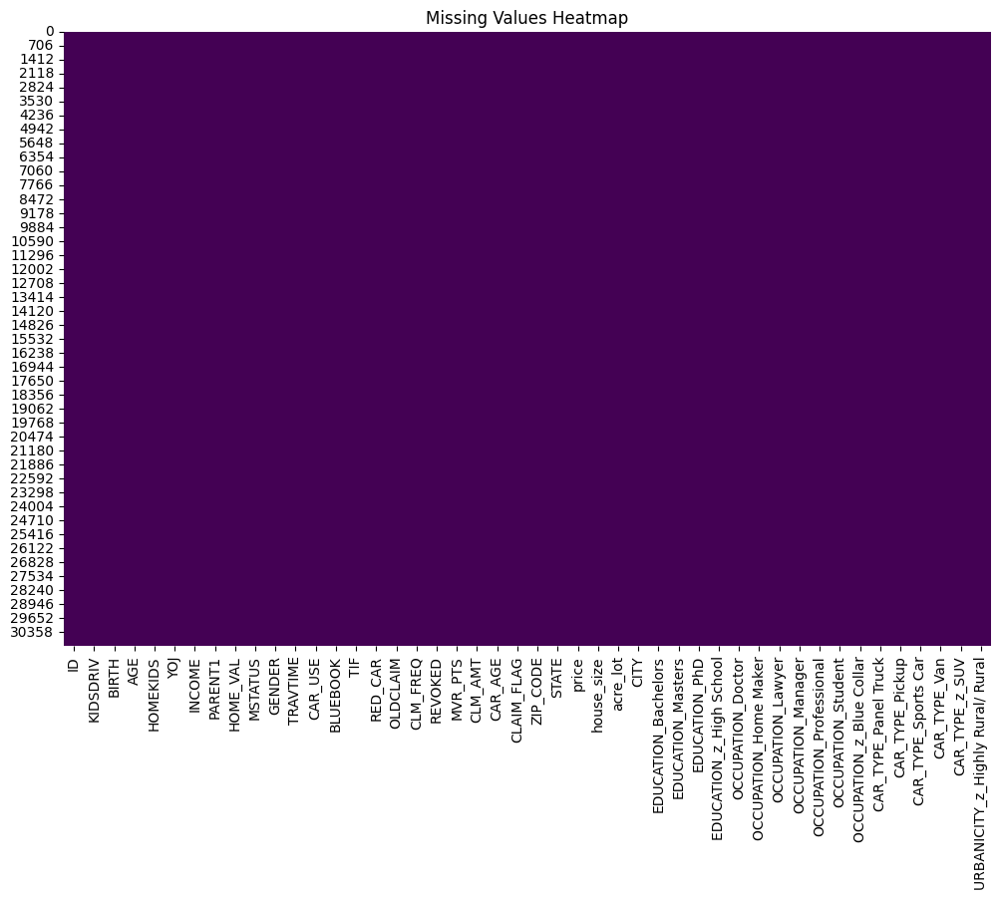

In [101]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plotting the heatmap for missing values
plt.figure(figsize=(12, 8))
sns.heatmap(df_merged.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Values Heatmap')
plt.show()


#### 7. Outlier Detection Using Z-Score

In [110]:
import pandas as pd
import numpy as np
from scipy import stats
from scipy.stats import zscore

# Select numeric columns from the dataframe
numeric_columns = df_merged.select_dtypes(include=[np.number]).columns

# Initialize a dictionary to hold the outlier counts
outlier_counts = {}

# Iterate through each numeric column to calculate Z-scores and outlier counts
for column in numeric_columns:
    z_scores = np.abs(stats.zscore(df_merged[column].dropna()))  # Drop NaN values for Z-score calculation
    outlier_counts[column] = (z_scores > 3).sum()  # Count how many z-scores are greater than 3

# Convert the results to a DataFrame for easier viewing
outlier_counts_df = pd.DataFrame(outlier_counts.items(), columns=['Column', 'Outlier Count']).set_index('Column')

# Display the outlier counts
print(outlier_counts_df)


                                  Outlier Count
Column                                         
ID                                            0
KIDSDRIV                                   2390
AGE                                           0
HOMEKIDS                                      0
YOJ                                           0
INCOME                                       95
PARENT1                                       0
HOME_VAL                                      2
MSTATUS                                       0
GENDER                                        0
TRAVTIME                                      0
CAR_USE                                       0
BLUEBOOK                                      0
TIF                                           0
RED_CAR                                       0
OLDCLAIM                                    265
CLM_FREQ                                      0
REVOKED                                       0
MVR_PTS                                 

#### Replacing outliers in dataset with IQR

In [111]:
# Function to replace outliers using IQR
def replace_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)  # First quartile
    Q3 = df[column].quantile(0.75)  # Third quartile
    IQR = Q3 - Q1  # Interquartile range

    # Define bounds for outliers
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Replace outliers with the respective bounds
    df[column] = np.where(df[column] < lower_bound, lower_bound, df[column])
    df[column] = np.where(df[column] > upper_bound, upper_bound, df[column])

# Apply the function to numeric columns
for column in numeric_columns:
    replace_outliers_iqr(df_merged, column)


#### Checking Outlier Counts Again

In [112]:
# Check outlier counts again
outlier_counts = {}

for column in numeric_columns:
    z_scores = np.abs(stats.zscore(df_merged[column].dropna()))
    outlier_counts[column] = (z_scores > 3).sum()

# Display updated outlier counts
outlier_counts_df = pd.DataFrame(outlier_counts.items(), columns=['Column', 'Outlier Count']).set_index('Column')
print(outlier_counts_df)


                                  Outlier Count
Column                                         
ID                                            0
KIDSDRIV                                      0
AGE                                           0
HOMEKIDS                                      0
YOJ                                           0
INCOME                                        0
PARENT1                                       0
HOME_VAL                                      2
MSTATUS                                       0
GENDER                                        0
TRAVTIME                                      0
CAR_USE                                       0
BLUEBOOK                                      0
TIF                                           0
RED_CAR                                       0
OLDCLAIM                                      0
CLM_FREQ                                      0
REVOKED                                       0
MVR_PTS                                 

##  Exploratory Data Analysis (EDA)

#### 1. Univariate Analysis

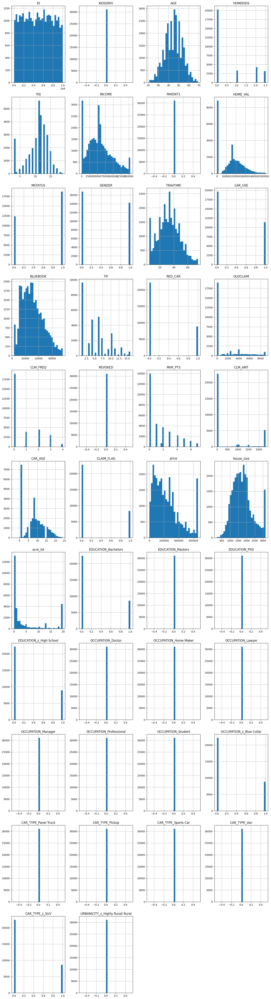

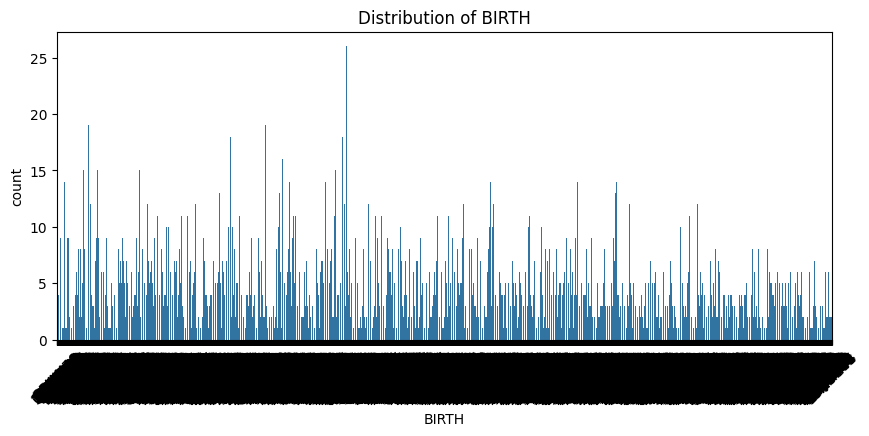

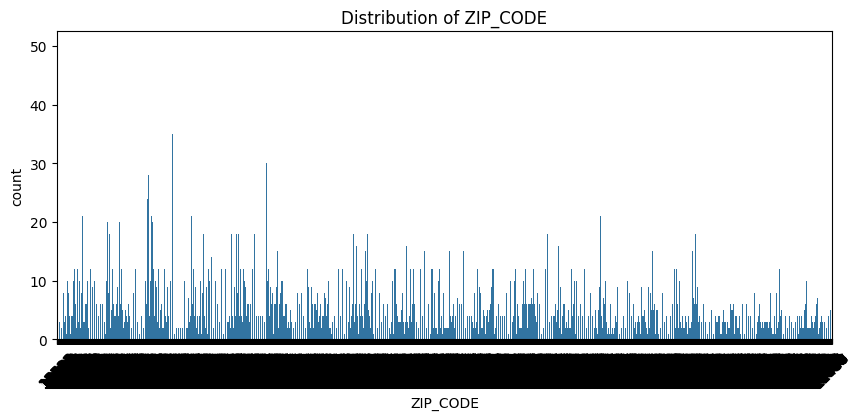

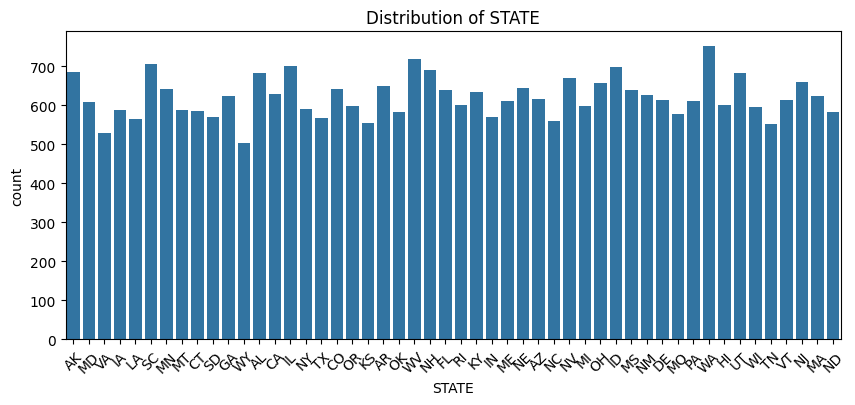

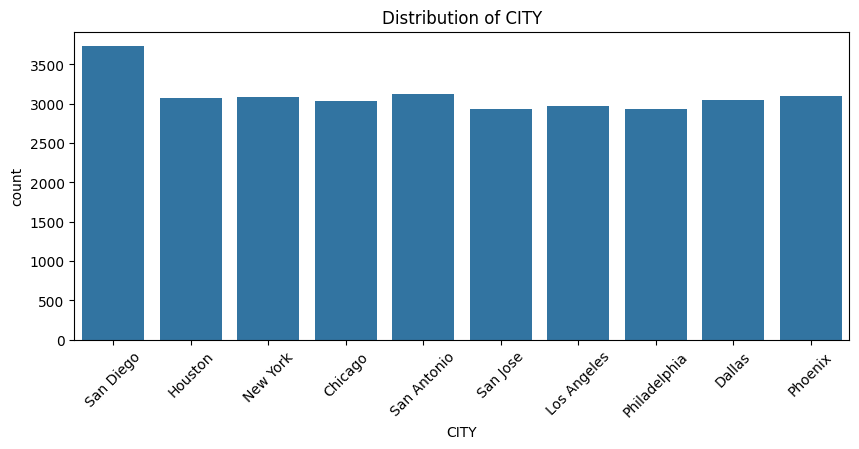

In [113]:
import matplotlib.pyplot as plt
import seaborn as sns

# Identify numeric columns
numeric_columns = df_merged.select_dtypes(include=['float64', 'int64']).columns

# Create histograms for numeric columns
num_cols = len(numeric_columns)
nrows = (num_cols // 4) + (num_cols % 4 > 0)  # Calculate the number of rows needed

df_merged[numeric_columns].hist(bins=30, figsize=(15, 5 * nrows), layout=(nrows, 4))
plt.tight_layout()
plt.show()

# Count plots for categorical columns
categorical_columns = df_merged.select_dtypes(include=['object', 'category']).columns
for col in categorical_columns:
    plt.figure(figsize=(10, 4))
    sns.countplot(data=df_merged, x=col)
    plt.title(f'Distribution of {col}')
    plt.xticks(rotation=45)
    plt.show()


### 2. Bivariate Analysis

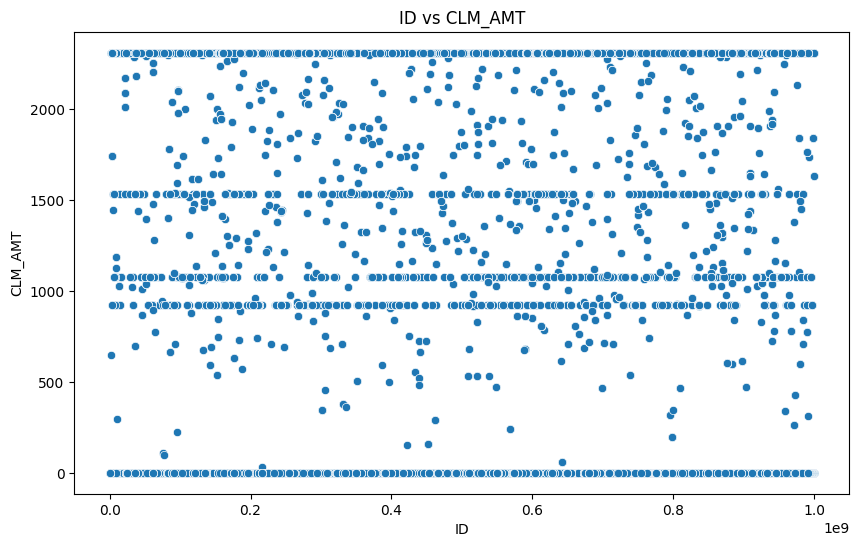

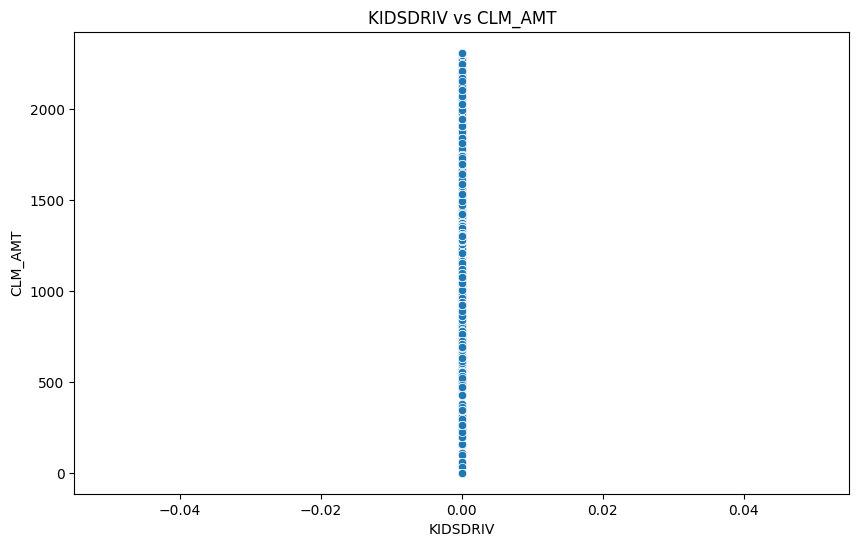

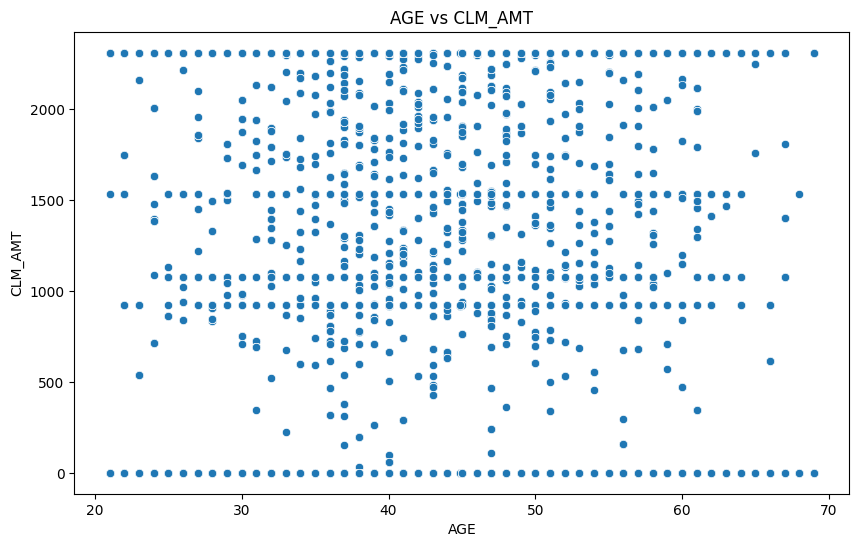

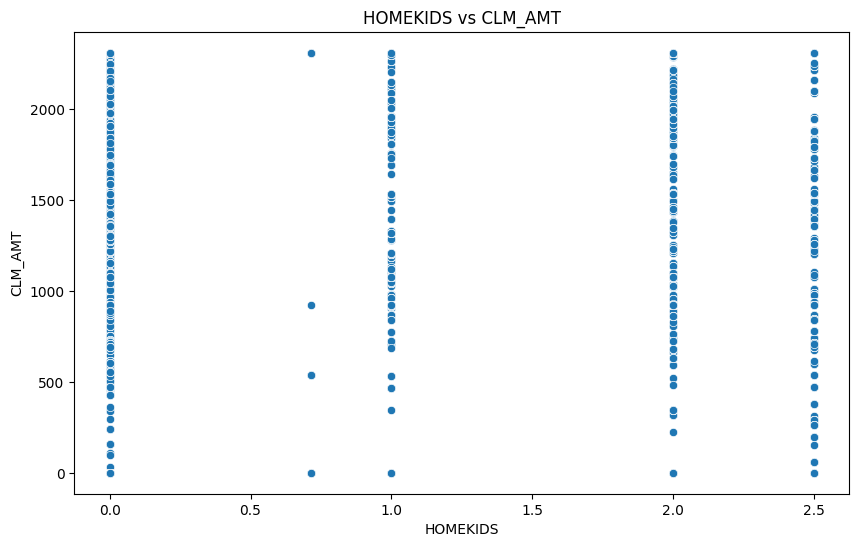

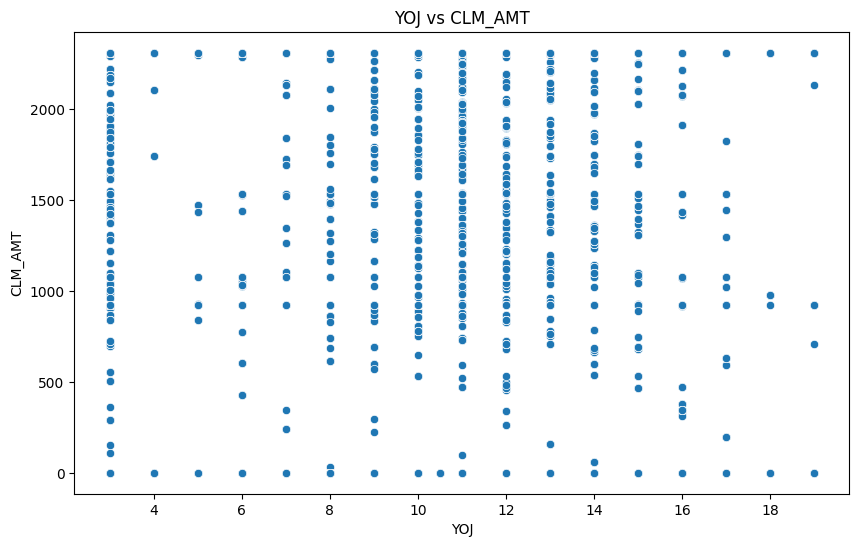

...

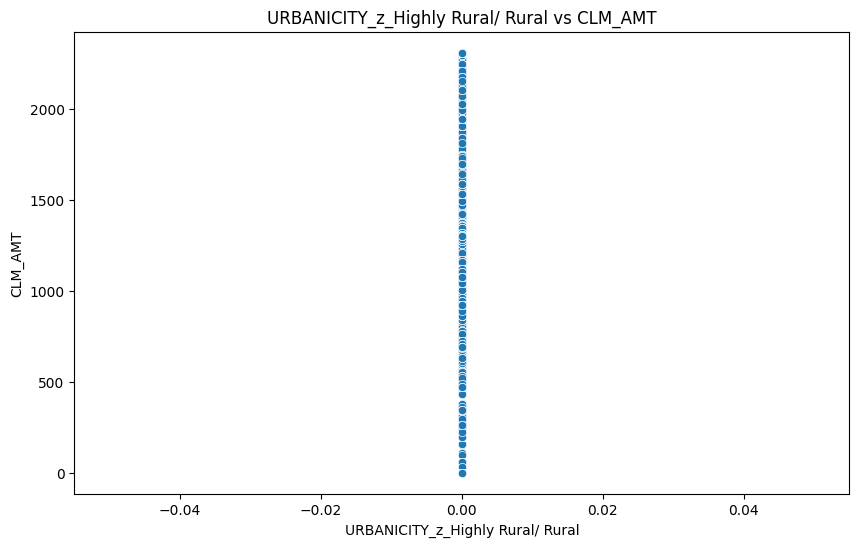

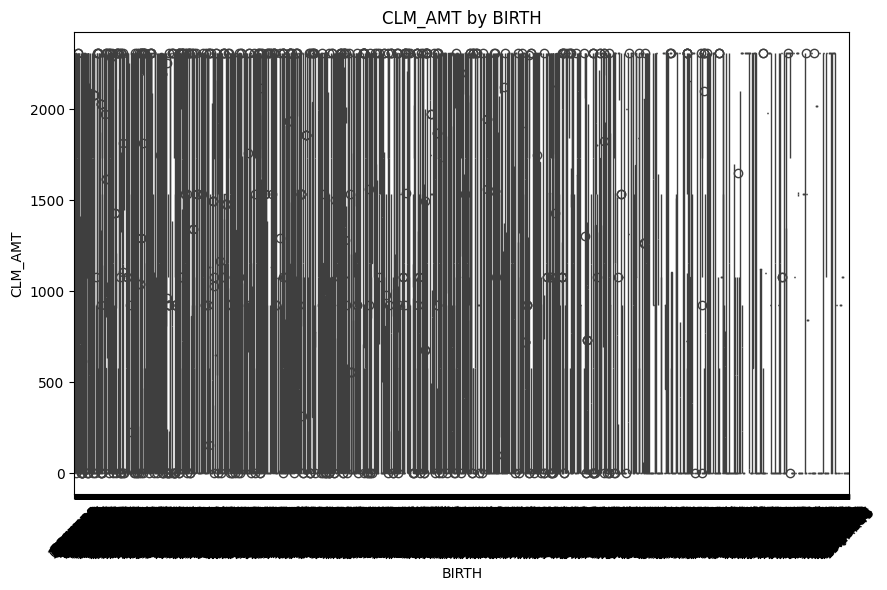

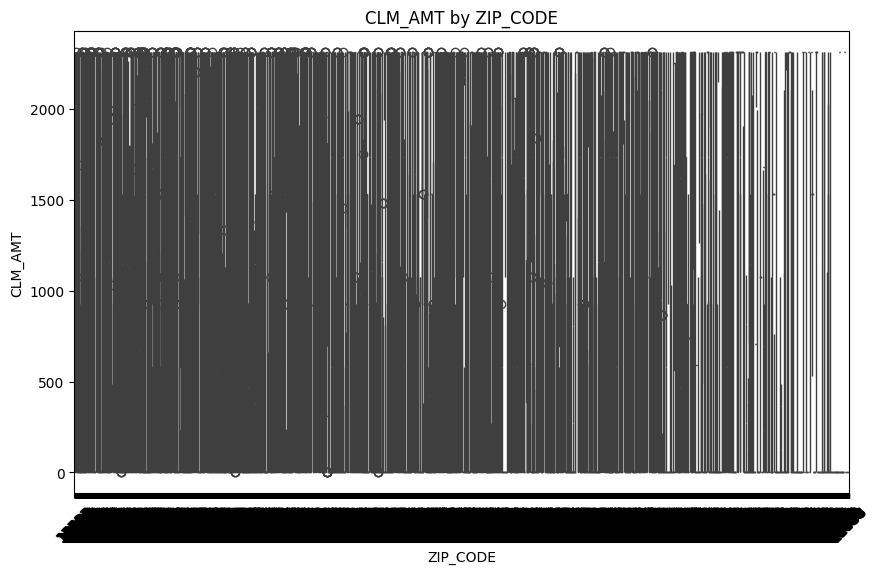

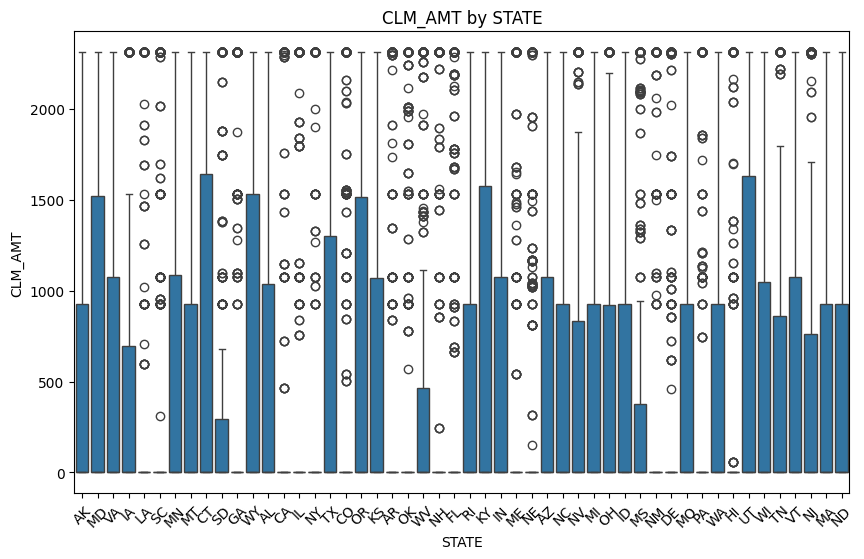

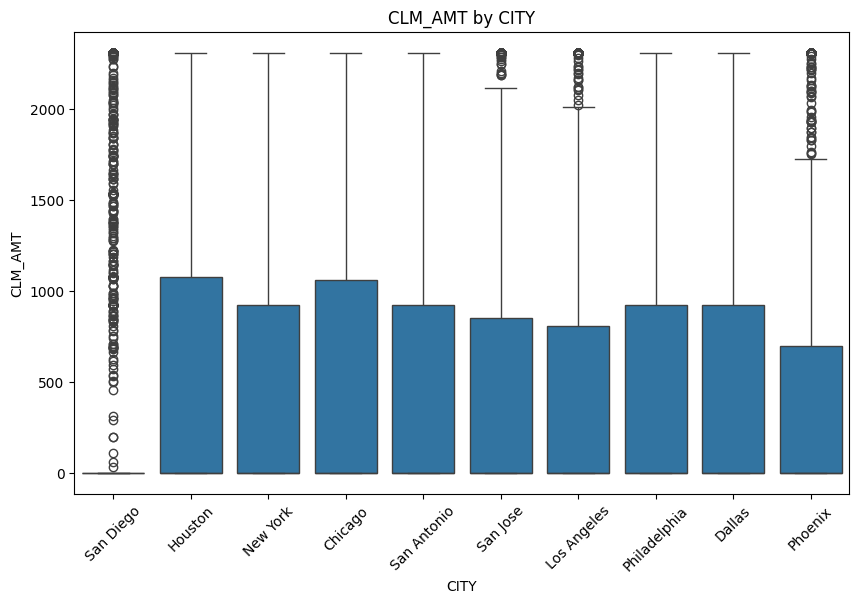

In [115]:
# Scatter plots for numeric vs numeric
for col in numeric_columns:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=df_merged, x=col, y='CLM_AMT')  # Replace 'CLM_AMT' with your target variable
    plt.title(f'{col} vs CLM_AMT')
    plt.show()

# Boxplots for categorical vs numeric
for col in categorical_columns:
    if col != 'CLM_AMT':  # Exclude target variable
        plt.figure(figsize=(10, 6))
        sns.boxplot(data=df_merged, x=col, y='CLM_AMT')
        plt.title(f'CLM_AMT by {col}')
        plt.xticks(rotation=45)
        plt.show()


### 3. Multivariate Analysis

In [69]:
pip install plotly

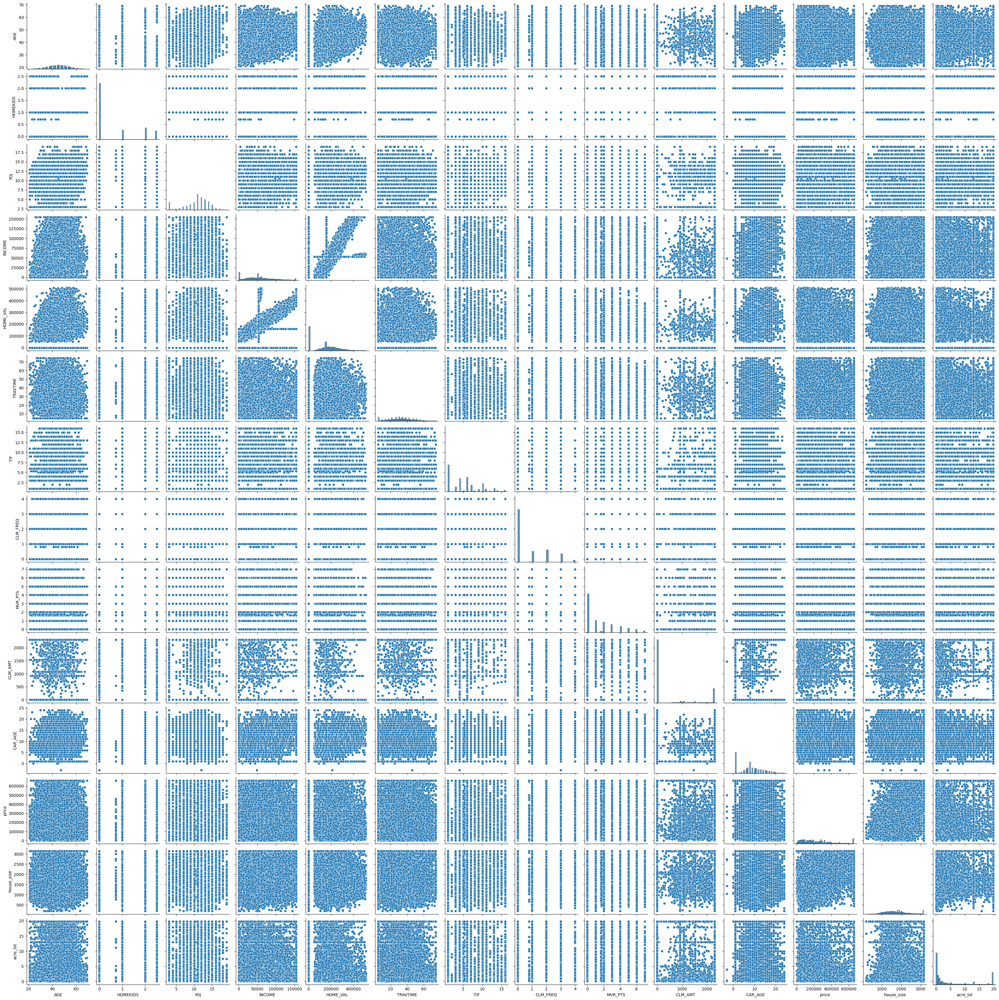

In [116]:
import seaborn as sns
import matplotlib.pyplot as plt

# Updated list of numeric columns for pairplot
numeric_columns = [
    'AGE',
    'HOMEKIDS',
    'YOJ',
    'INCOME',
    'HOME_VAL',
    'TRAVTIME',
    'TIF',
    'CLM_FREQ',
    'MVR_PTS',
    'CLM_AMT',
    'CAR_AGE',
    'price',
    'house_size',
    'acre_lot'
]

# Pairplot for selected numeric variables
sns.pairplot(df_merged[numeric_columns])
plt.show()


#### Correlation Heatmap 

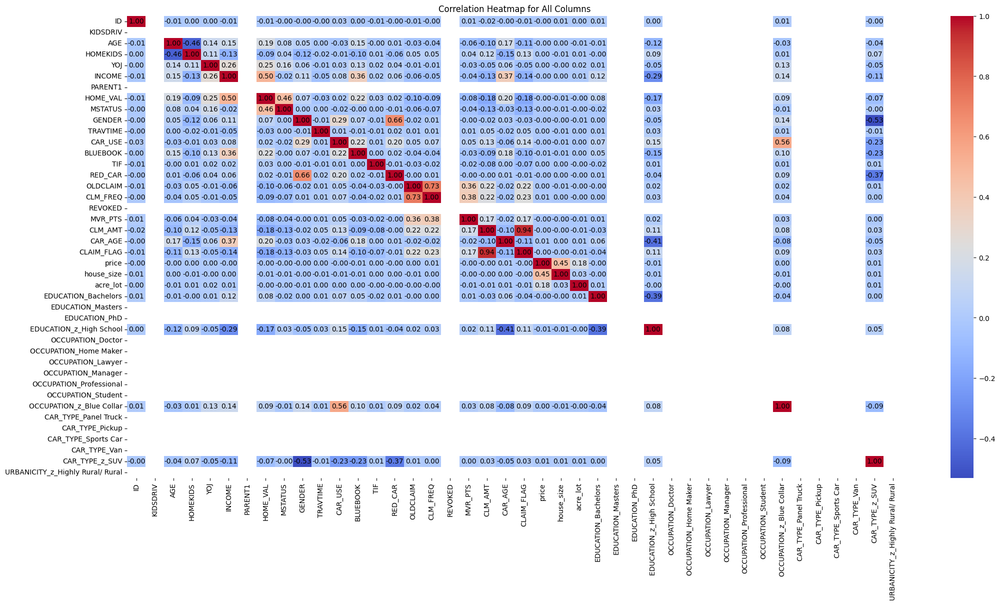

In [122]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Convert the DataFrame to include only numeric data for correlation
df_numeric = df_merged.select_dtypes(include=[int, float])

# Calculate the correlation matrix for all numeric columns
corr_matrix = df_numeric.corr()

# Heatmap for correlation among all columns with black numbers
plt.figure(figsize=(25, 12))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', annot_kws={'color': 'black'})
plt.title('Correlation Heatmap for All Columns')
plt.show()



                  Variable 1                Variable 2  Correlation
0                 CLAIM_FLAG                   CLM_AMT     0.944640
1                    CLM_AMT                CLAIM_FLAG     0.944640
2                   CLM_FREQ                  OLDCLAIM     0.728015
3                   OLDCLAIM                  CLM_FREQ     0.728015
4                     GENDER                   RED_CAR     0.662525
5                    RED_CAR                    GENDER     0.662525
6   OCCUPATION_z_Blue Collar                   CAR_USE     0.562575
7                    CAR_USE  OCCUPATION_z_Blue Collar     0.562575
8                     INCOME                  HOME_VAL     0.501532
9                   HOME_VAL                    INCOME     0.501532
10                  HOME_VAL                   MSTATUS     0.456134
11                   MSTATUS                  HOME_VAL     0.456134
12                     price                house_size     0.453023
13                house_size                    

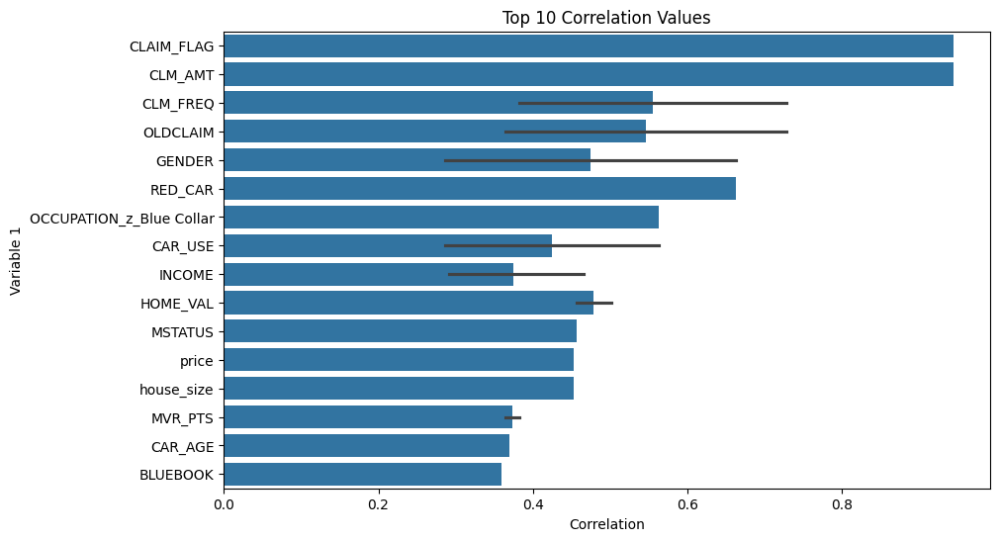

In [123]:
# Get the top 10 correlation values
corr_pairs = corr_matrix.unstack().sort_values(ascending=False)
top_10_corr = corr_pairs[corr_pairs < 1].head(25)

# Display the top 10 correlation values as a DataFrame
top_10_corr_df = pd.DataFrame(top_10_corr, columns=['Correlation']).reset_index()
top_10_corr_df.columns = ['Variable 1', 'Variable 2', 'Correlation']
print(top_10_corr_df)

# Bar plot for the top 10 correlation values
plt.figure(figsize=(10, 6))
sns.barplot(x='Correlation', y='Variable 1', data=top_10_corr_df)
plt.title('Top 10 Correlation Values')
plt.show()


### 4. Correlation Analysis

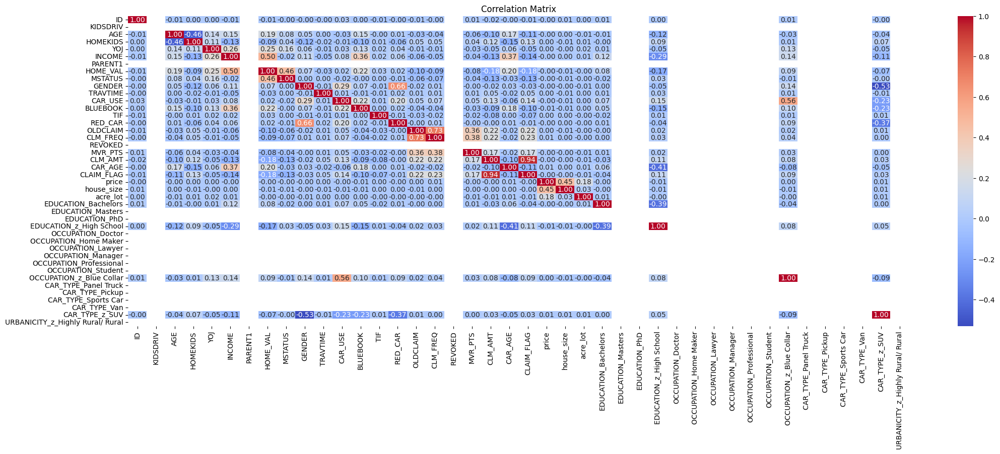

In [126]:
# Correlation matrix
correlation_matrix = df_numeric.corr()
plt.figure(figsize=(25, 8))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()


In [127]:
# Calculate the correlation matrix for numeric columns
correlation_matrix = df_numeric.corr()

# Display the correlation matrix
print(correlation_matrix)


                                        ID  KIDSDRIV       AGE  HOMEKIDS  \
ID                                1.000000       NaN -0.012006  0.004874   
KIDSDRIV                               NaN       NaN       NaN       NaN   
AGE                              -0.012006       NaN  1.000000 -0.457206   
HOMEKIDS                          0.004874       NaN -0.457206  1.000000   
YOJ                               0.001644       NaN  0.137022  0.110664   
INCOME                           -0.013668       NaN  0.154735 -0.132578   
PARENT1                                NaN       NaN       NaN       NaN   
HOME_VAL                         -0.007489       NaN  0.193541 -0.090895   
MSTATUS                          -0.004498       NaN  0.082792  0.039868   
GENDER                           -0.001946       NaN  0.052936 -0.116725   
TRAVTIME                         -0.001491       NaN  0.003113 -0.017335   
CAR_USE                           0.025890       NaN -0.026940 -0.010690   
BLUEBOOK    